<a href="https://colab.research.google.com/github/Tiagoeem/testes_git_python_renderers/blob/master/Teste_Libs_Plots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Este notebook tem o intuito de comparar algumas bibliotecas para geração de gráficos. Principalemnte com relação ao seu desempenho e renderização estatica no github.




In [6]:
import pandas as pd
import numpy as np
import time

In [7]:
from sklearn.datasets import make_blobs
# Criando um buzilão de dados
n_samples = 60000
n_dimensions = 3

X, y = make_blobs(n_samples=n_samples, centers=60, n_features=3, cluster_std=0.7, random_state=0)

# O velho e bom Matplotlib

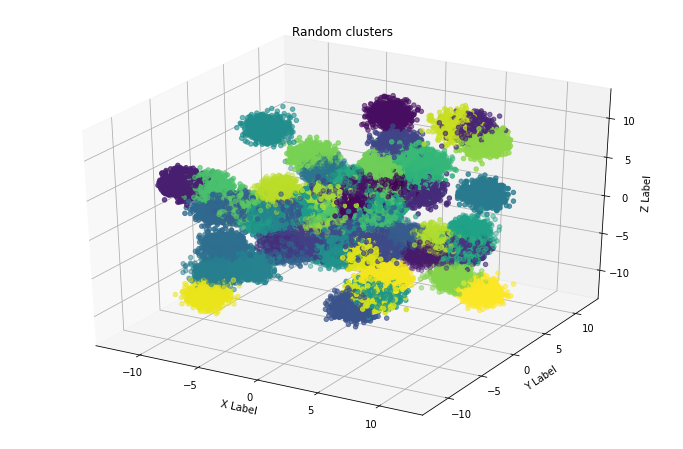

Tempo:  1.1301238536834717


In [8]:
import matplotlib.pyplot as plt

start = time.time()
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter3D(X[:,0], X[:,1], X[:,2], c=y)
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_title('Random clusters')

plt.show()
end = time.time()
print( 'Tempo: ' ,end - start)

# O incrivel e interativo mas pesadissímo Plotly

Deu pau para 600k pontos, tive que reduzir

In [9]:
import plotly.express as px

start = time.time()

fig2 = px.scatter_3d( x=X[:,0], y=X[:,1], z=X[:,2], color=y, title="Random Clusters")
fig2.show()

end = time.time()
print( 'Tempo: ' ,end - start)

Tempo:  1.1096761226654053


# Bokeh

In [10]:
from bokeh.plotting import figure 
from bokeh.io import output_notebook, show
# Next, we'll tell Bokeh to display its plots directly into the notebook. This will cause all of the Javascript and data to be embedded directly into the HTML of the notebook itself. (Bokeh can output straight to HTML files, or use a server, which we'll look at later.)
output_notebook()


In [11]:
start = time.time()
p = figure(width=800, height=400)
p.circle(X[:,0], X[:,1], size=y, fill_color=y, alpha=0.5)
show(p)
end = time.time()
print( 'Tempo: ' ,end - start)

Tempo:  0.7813770771026611


# Chartify

In [12]:
! pip install chartify

     |████████████████████████████████| 71kB 2.4MB/s 
     |████████████████████████████████| 788kB 9.5MB/s 
     |████████████████████████████████| 122kB 38.2MB/s 
     |████████████████████████████████| 942kB 29.9MB/s 
     |████████████████████████████████| 358kB 41.0MB/s 
ERROR: jupyter-console 5.2.0 has requirement prompt-toolkit<2.0.0,>=1.0.0, but you'll have prompt-toolkit 3.0.7 which is incompatible.
ERROR: google-colab 1.0.0 has requirement ipykernel~=4.10, but you'll have ipykernel 5.3.4 which is incompatible.
ERROR: google-colab 1.0.0 has requirement ipython~=5.5.0, but you'll have ipython 7.16.1 which is incompatible.
  Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      Successfully uninstalled prompt-toolkit-1.0.18
  Found existing installation: ipython 5.5.0
    Uninstalling ipython-5.5.0:
      Successfully uninstalled ipython-5.5.0
  Found existing installation: ipykernel 4.10.1
    Uninstalling ipykernel-4.10.1:
      Succe

In [13]:
import chartify

start = time.time()

data = pd.DataFrame( X, columns=['x1','x2', 'x3'] )
data['y'] = y

ch = chartify.Chart(blank_labels=True, x_axis_type='linear', y_axis_type='linear')

ch.plot.scatter(
        data_frame=data,
        color_column='y',
        x_column='x1',
        y_column='x2')
ch.set_title("Random")
ch.set_subtitle("Generated by make_blob.")

ch.show()

end = time.time()
print( 'Tempo: ' ,end - start)

Tempo:  1.7856850624084473


# Seaborn

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



Tempo:  0.2984945774078369


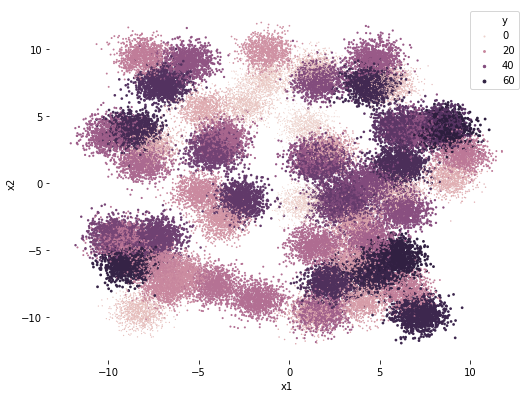

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

start = time.time()

data = pd.DataFrame( X, columns=['x1','x2', 'x3'] )
data['y'] = y

f, ax = plt.subplots(figsize=(8.5, 6.5))

sns.despine(f, left=True, bottom=True)
sns.scatterplot(x="x1", y="x2",
                hue="y", size="y",
                sizes=(1, 8), linewidth=0,
                data=data, ax=ax)



end = time.time()
print( 'Tempo: ' ,end - start)


# Altair

Não rodou não: https://altair-viz.github.io/user_guide/display_frontends.html

In [15]:
#!pip install altair

In [16]:
#!pip install vega
#!jupyter nbextension install --sys-prefix --py vega

In [23]:
from vega_datasets import data
cars = data.cars()
type(cars)

pandas.core.frame.DataFrame

In [25]:
import altair as alt

data = pd.DataFrame( X, columns=['x1','x2', 'x3'] )
data['y'] = y

#limite de 5000
alt.Chart(data.head(5000)).mark_circle(size=60).encode(
    x='x1',
    y='x2',
    color='y',
    tooltip=['x1', 'x2', 'x3', 'y']
).interactive()

alt.Chart(...)

# Leather

Apenas cria SVG

In [19]:
!pip install leather

In [28]:
import leather
from IPython.display import Image, SVG

def colorizer(d):
    return 'rgb(%i, %i, %i)' % (d.x, d.y, 150)

chart = leather.Chart('Colorized dots')
chart.add_dots(X, fill_color=colorizer)
chart.to_svg('examples/charts/colorized_dots2.svg')
SVG('examples/charts/colorized_dots2.svg')
